In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.linear_model import Lasso
from scipy.io import loadmat
from sklearn.metrics import mean_squared_error
from scipy.integrate import solve_ivp

import pysindy as ps

import os

# Ignore matplotlib deprecation warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Seed the random number generators for reproducibility
np.random.seed(100)

integrator_keywords = {}
integrator_keywords['rtol'] = 1e-12
integrator_keywords['method'] = 'LSODA'
integrator_keywords['atol'] = 1e-12

In [2]:
def testscore(predtmp,oritmp):
    score=1
    pred=np.ravel(predtmp)
    ori=np.ravel(oritmp)
    n=0
    for i in range(len(pred)):
        if ori[i]!=0:
            n=n+1
    #print(n)
    for i in range(len(pred)):
        if ori[i]!=0:
            score=score-1/n*abs(pred[i]-ori[i])/abs(ori[i])/2
            #print(abs(pred[i]-ori[i])/abs(ori[i]))
    print('score:')
    print(score)
    return score

In [3]:

file_path = os.path.join('D:\\', 'hotaidata','sr_C4_12')
x=[]
y=[]
vx=[]
vy=[]
isvalid=[]
xtmp=[]
ytmp=[]
vxtmp=[]
vytmp=[]
isvalidtmp=[]
for root,dirs,files in os.walk(file_path):
    #print(root)
    
    for dir in dirs:
        #print(os.path.join(root,file))

            with open(os.path.join(root,dir,'B00001.dat'), 'r') as f:  
                lines = f.readlines()
                for line in lines[3:]: 
                    num=line.split()
                    xtmp.append(float(num[0]))
                    ytmp.append(float(num[1]))
                    vxtmp.append(float(num[2]))
                    vytmp.append(float(num[3]))
                    isvalidtmp.append(float(num[4]))

            x.append(np.array(xtmp).reshape(25,25))
            y.append(np.array(ytmp).reshape(25,25))
            vx.append(np.array(vxtmp).reshape(25,25))
            vy.append(np.array(vytmp).reshape(25,25))
            isvalid.append(np.array(isvalidtmp).reshape(25,25))
            xtmp=[]
            ytmp=[]
            vxtmp=[]
            vytmp=[]
            isvalidtmp=[]
#
x=np.array(x)
y=np.array(y)
vx=np.array(vx)
vy=np.array(vy)
isvalid=np.array(isvalid)

x=x.T
y=y.T
vx=vx.T
vy=vy.T
#print(x[0,:,:])
t=np.linspace(0,0.0008,40)

dt=0.00002


In [4]:



spatial_grid = np.asarray([x[:,:,0].T,y[:,:,0].T]).T
'''
print('spatial_grid')
print(spatial_grid.shape)
print(spatial_grid)
'''

n=25

u=np.zeros((n,n,121, 2))
tmp=np.zeros((n,n,40, 2))
u[:, :, :, 0] = vx
u[:, :, :, 1] = vy
u_train=np.zeros((n,n,40, 2))
save=np.zeros((n,n,40, 2))
u_train=u[:,:,80:120,:]
save=u[:,:,80:120,:]

'''
u_up=u_train
u_up[:,:n-1,:,:]=u_train[:,1:,:,:]
u_up[:,n-1,:,:]=u_train[:,0,:,:]
u_low=u_train
u_low[:,0,:,:]=u_train[:,n-1,:,:]
u_low[:,1:,:,:]=u_train[:,:n-1,:,:]
u_left=u_train
u_left[n-1,:,:,:]=u_train[0,:,:,:]
u_left[:n-1,:,:,:]=u_train[1:,:,:,:]
u_right=u_train
u_right[1:,:,:,:]=u_train[:n-1,:,:,:]
u_right[0,:,:,:]=u_train[n-1,:,:,:]
tmp[:, :, :, 0]=u_train[:,:,:,0]
tmp[:, :, :, 1]=u_train[:,:,:,1]
tmp[:, :, :, 2]=u_up[:,:,:,0]
tmp[:, :, :, 3]=u_up[:,:,:,1]
tmp[:, :, :, 4]=u_low[:,:,:,0]
tmp[:, :, :, 5]=u_low[:,:,:,1]

tmp[:, :, :, 6]=u_left[:,:,:,0]
tmp[:, :, :, 7]=u_left[:,:,:,1]
tmp[:, :, :, 8]=u_right[:,:,:,0]
tmp[:, :, :, 9]=u_right[:,:,:,1]
'''


'\nu_up=u_train\nu_up[:,:n-1,:,:]=u_train[:,1:,:,:]\nu_up[:,n-1,:,:]=u_train[:,0,:,:]\nu_low=u_train\nu_low[:,0,:,:]=u_train[:,n-1,:,:]\nu_low[:,1:,:,:]=u_train[:,:n-1,:,:]\nu_left=u_train\nu_left[n-1,:,:,:]=u_train[0,:,:,:]\nu_left[:n-1,:,:,:]=u_train[1:,:,:,:]\nu_right=u_train\nu_right[1:,:,:,:]=u_train[:n-1,:,:,:]\nu_right[0,:,:,:]=u_train[n-1,:,:,:]\ntmp[:, :, :, 0]=u_train[:,:,:,0]\ntmp[:, :, :, 1]=u_train[:,:,:,1]\ntmp[:, :, :, 2]=u_up[:,:,:,0]\ntmp[:, :, :, 3]=u_up[:,:,:,1]\ntmp[:, :, :, 4]=u_low[:,:,:,0]\ntmp[:, :, :, 5]=u_low[:,:,:,1]\n\ntmp[:, :, :, 6]=u_left[:,:,:,0]\ntmp[:, :, :, 7]=u_left[:,:,:,1]\ntmp[:, :, :, 8]=u_right[:,:,:,0]\ntmp[:, :, :, 9]=u_right[:,:,:,1]\n'

In [5]:
u_dot = ps.FiniteDifference(axis=2)._differentiate(u_train, dt)
tmp[:,:,0]=u_train[:,:,0]
for i in range(len(t)-1):
    tmp[:,:,i+1]=tmp[:,:,i]+u_dot[:,:,i]*dt
testscore(tmp,u_train)
tmp=u_train+u_dot*dt
tmp[:,:,1:]=tmp[:,:,:len(t)-1]
testscore(tmp,u_train)

score:
-3.5798525560826437
score:
-0.8355080071035742


-0.8355080071035742

In [6]:
op=np.zeros(len(t))
op=u_train[10,10,:,0]

<function matplotlib.pyplot.show(close=None, block=None)>

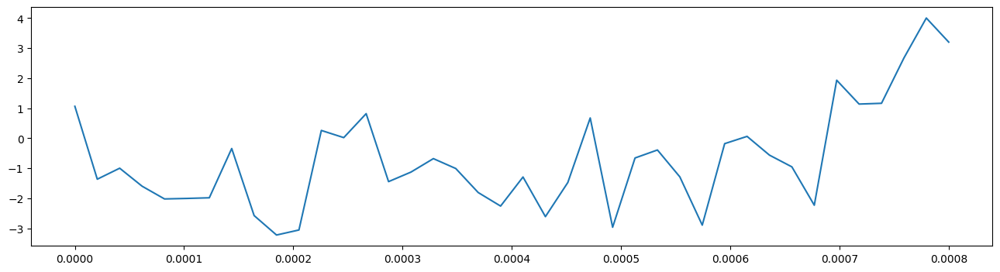

In [7]:
plt.figure(figsize=(16, 4))
plt.plot(t,op)
plt.show

score:
-0.7900947407128605


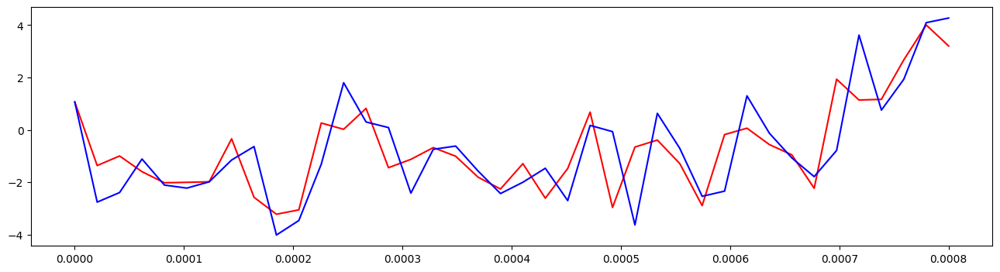

In [8]:

op_dot=np.zeros(len(t))
op_dot = ps.FiniteDifference(axis=0)._differentiate(op, dt)
tmpop=np.zeros(len(t))
tmpop[0]=op[0]
tmpop[1:]=op[:len(t)-1]+op_dot[:len(t)-1]*dt
plt.figure(figsize=(16, 4))
plt.plot(t,op,color='r')
plt.plot(t,tmpop,color='b')
plt.show
testscore(tmpop,op)
compare=np.zeros((len(t),2))
compare[:,0]=op
compare[:,1]=tmpop


score:
0.08180614270576611


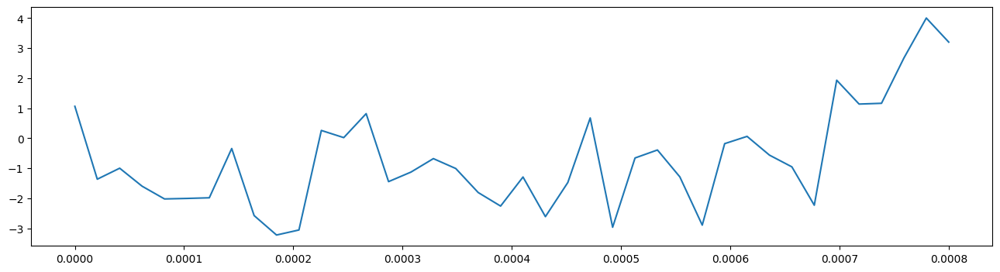

In [9]:
op_dot = ps.SINDyDerivative(kind="kalman", alpha=0.05)._differentiate(op, dt)
tmpop=np.zeros(len(t))
tmpop[0]=op[0]
tmpop[1:]=op[:len(t)-1]+op[:len(t)-1]*dt
plt.figure(figsize=(16, 4))
plt.plot(t,op)
plt.show
testscore(tmpop,op)
compare=np.zeros((len(t),2))
compare[:,0]=op
compare[:,1]=tmpop


0


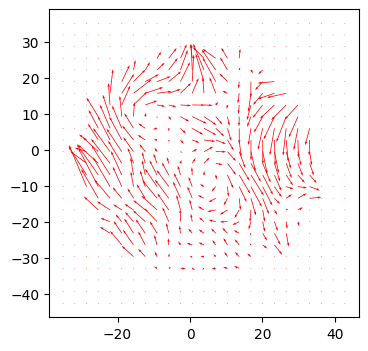

1


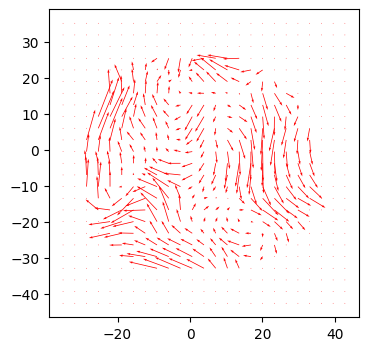

2


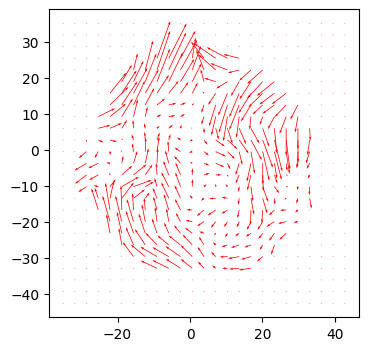

3


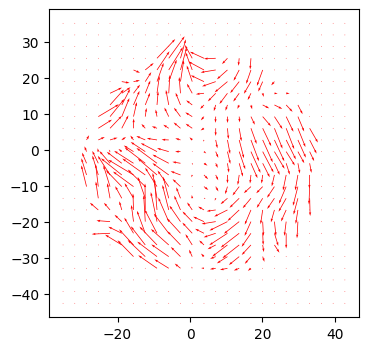

4


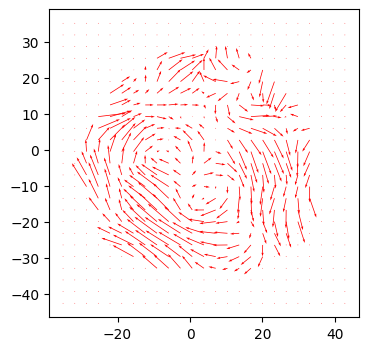

5


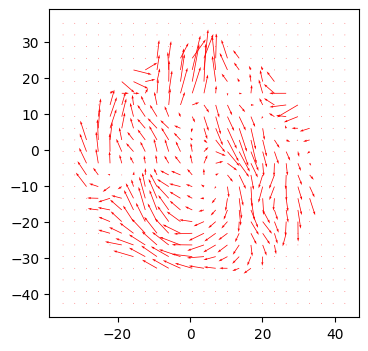

6


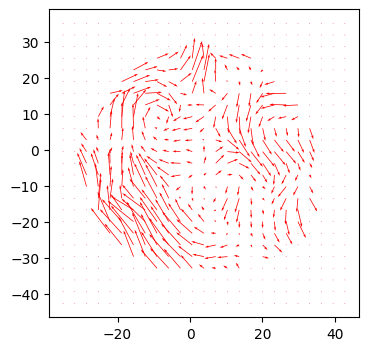

7


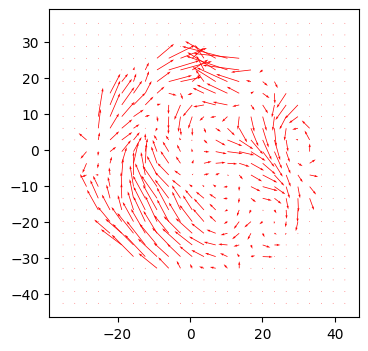

8


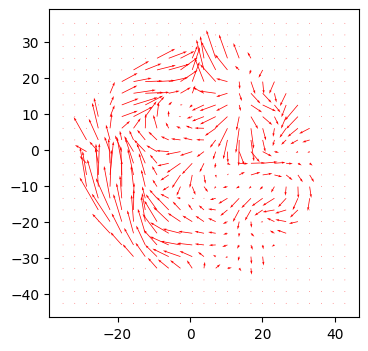

9


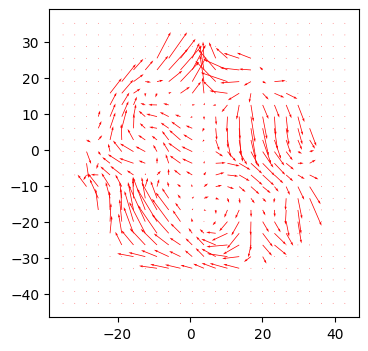

10


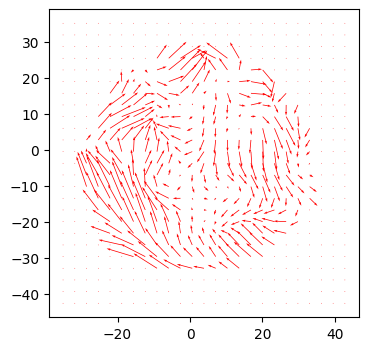

11


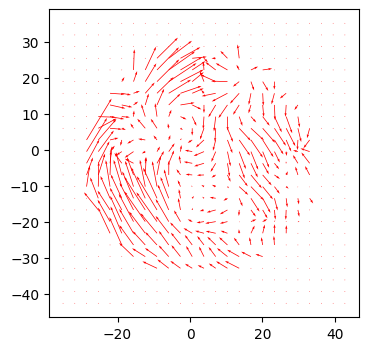

12


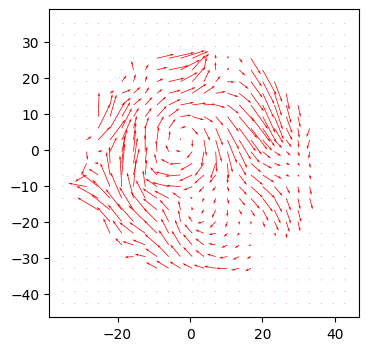

13


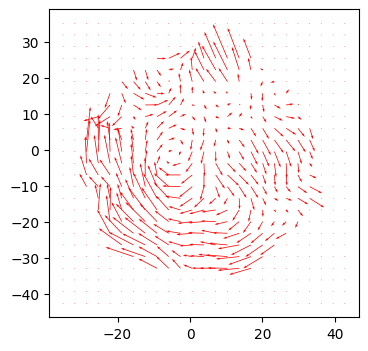

14


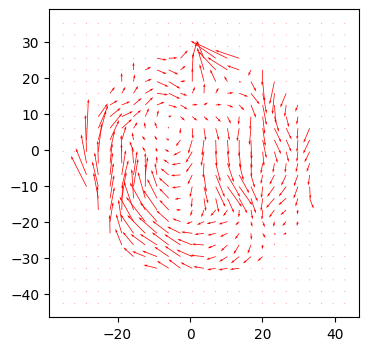

15


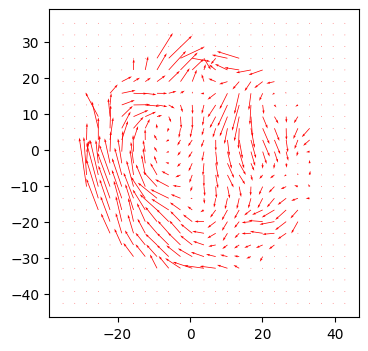

16


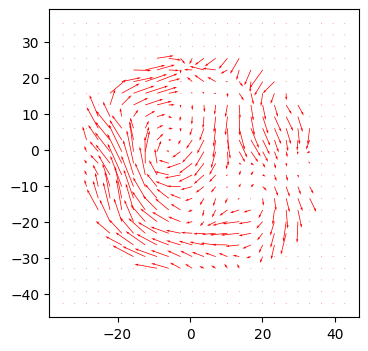

17


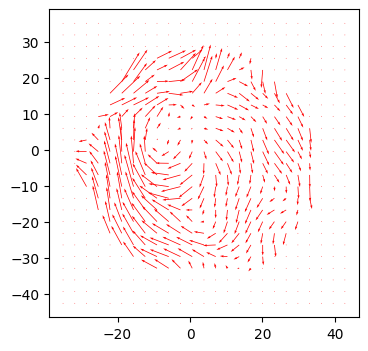

18


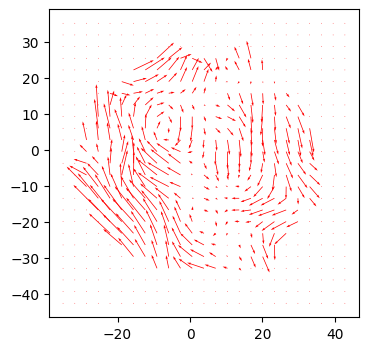

19


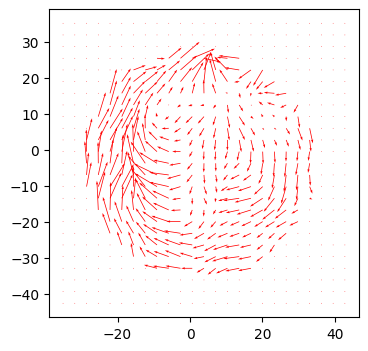

20


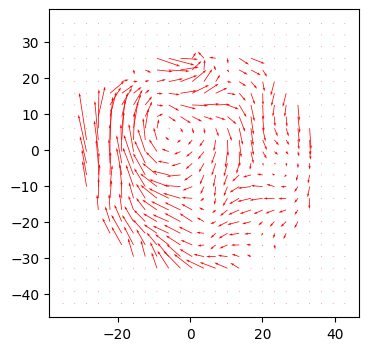

21


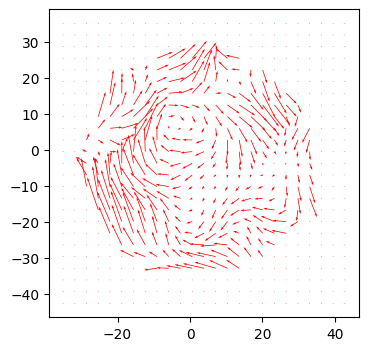

22


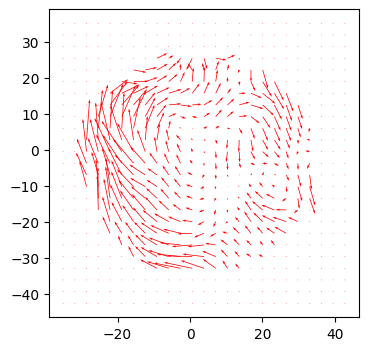

23


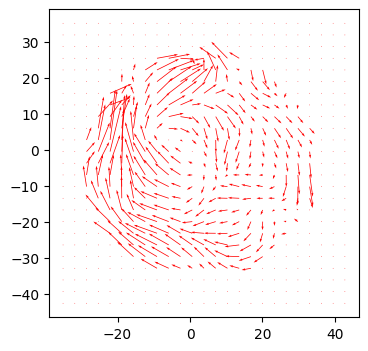

24


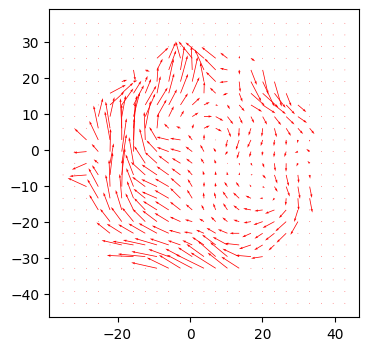

25


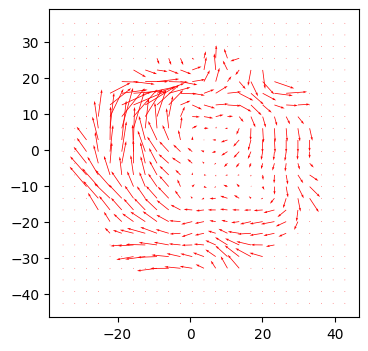

26


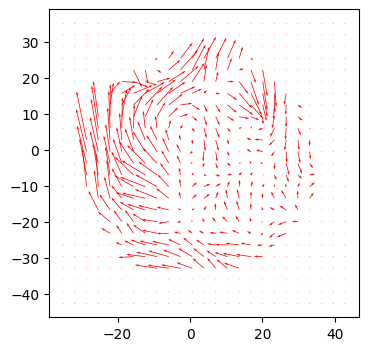

27


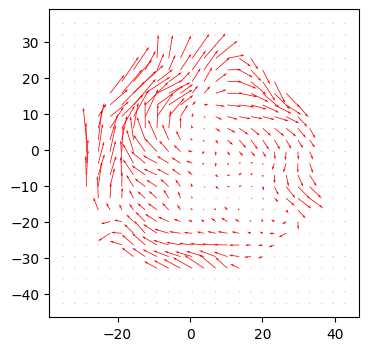

28


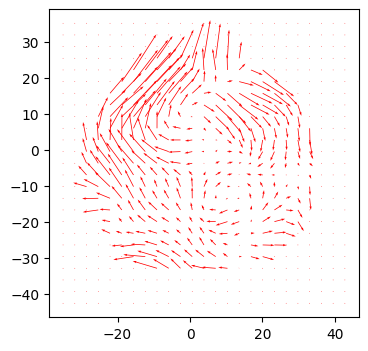

29


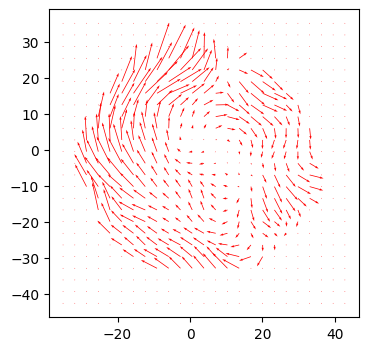

30


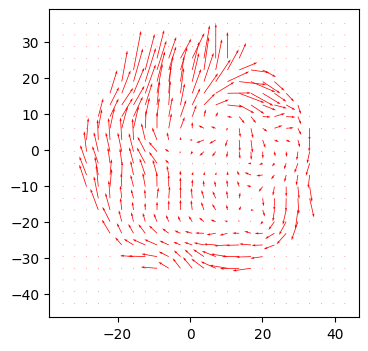

31


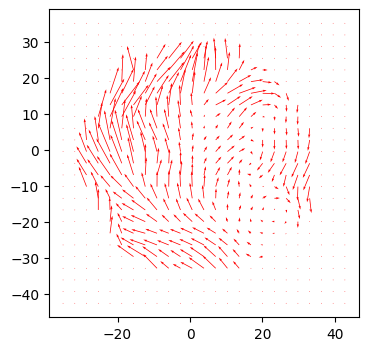

32


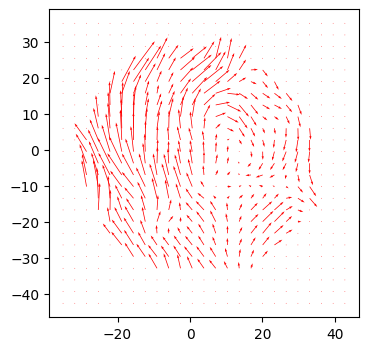

33


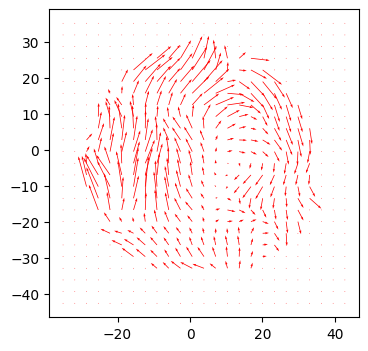

34


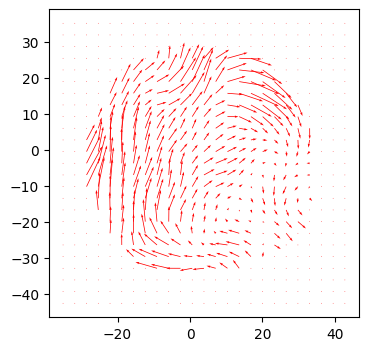

35


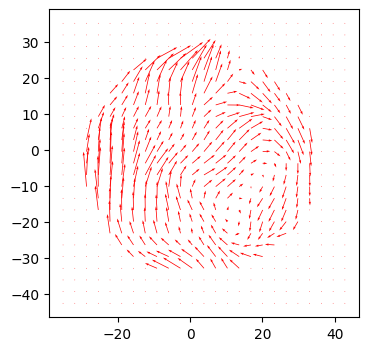

36


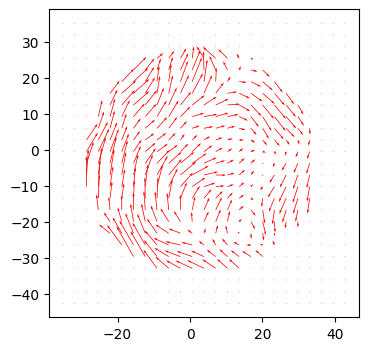

37


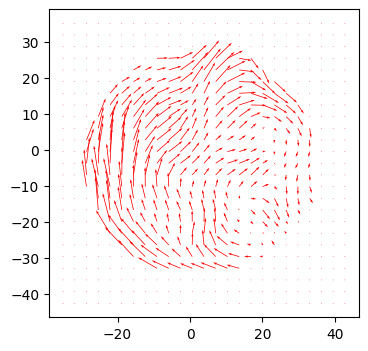

38


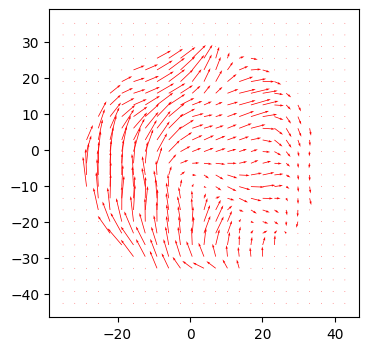

39


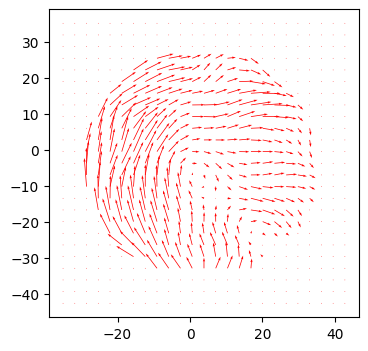

In [10]:
for i in range(40):
    print(i)
    plt.figure(figsize=(4,4))

    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],u_train[:,:,i,0],u_train[:,:,i,1],color='r')

    plt.show()

In [11]:
# Define PDE library that is quadratic in u, and
# fourth-order in spatial derivatives of u.
library_functions = [
    lambda y: y,
    lambda x: x * x * x,

    lambda x, y: x * y * y,
    lambda x, y: x * x * y,
]
library_function_names = [
    lambda y: y,
    lambda x: x + x + x,

    lambda x, y: x + y + y,
    lambda x, y: x + x + y,
]
pde_lib = ps.PDELibrary(
    library_functions=library_functions,
    function_names=library_function_names,
    derivative_order=3,
    spatial_grid=spatial_grid,
    include_bias=True,
    is_uniform=True,
    periodic=True
)


# Again, loop through all the optimizers
#print('STLSQ model: ')
print('u_train')
print(u_train.shape)



'''
print('SINDy')
model = ps.SINDy(feature_names=['Vx','Vy'])

model.fit(u_train, x_dot=u_dot_train)
model.print()
u_dot_stlsq = model.predict(u_train)

'''
print('STLSQ model: ')
optimizer = ps.STLSQ(threshold=50, alpha=1e-5, 
                     normalize_columns=True, max_iter=200)
model = ps.SINDy(feature_library=pde_lib, optimizer=optimizer,feature_names=['Vx','Vy'])
model.fit(u_train, dt)
model.print()
'''
print('SR3 model, L0 norm: ')
optimizer = ps.SR3(threshold=7, max_iter=10000, tol=1e-15, nu=1e2,
                   thresholder='l0', normalize_columns=True)
model = ps.SINDy(feature_library=pde_lib, optimizer=optimizer,feature_names=['Vx','Vy'])
model.fit(u_train, t=dt)
model.print()


print('SR3 model, L1 norm: ')
optimizer = ps.SR3(threshold=0.05, max_iter=10000, tol=1e-15,
                   thresholder='l1', normalize_columns=True)

model = ps.SINDy(feature_library=pde_lib, optimizer=optimizer)
model.fit(u_train, x_dot=u_dot_train)
model.print()'''

u_train
(25, 25, 40, 2)
STLSQ model: 
(Vx)' = 878.959 1 + 2072.544 Vx + -371.175 Vy + -105.641 VxVxVx + -1.695 VyVyVy + -54.863 VxVyVy + 42.325 VxVxVy + 3867.295 Vx_2 + 5495.962 Vy_2 + 8933.333 Vx_22 + -1298.119 Vy_22 + 1496.947 Vx_222 + -1461.804 Vy_222 + -5545.040 Vx_1 + -1044.765 Vy_1 + 19368.093 Vx_12 + 12212.556 Vy_12 + -42928.118 Vx_122 + 14187.431 Vy_122 + 6264.394 Vx_11 + 1858.477 Vy_11 + 12111.480 Vx_112 + 13146.063 Vy_112 + 3502.285 Vx_111 + 2024.601 Vy_111 + -6207.447 VxVx_2 + 3229.773 VxVy_2 + -43.443 VyVx_2 + -65.527 VyVy_2 + 108.787 VxVxVxVx_2 + -78.356 VxVxVxVy_2 + -3157.674 VyVyVyVx_2 + -2039.922 VyVyVyVy_2 + -126.019 VxVyVyVx_2 + 50.795 VxVyVyVy_2 + 82.612 VxVxVyVx_2 + -175.612 VxVxVyVy_2 + -2479.969 VxVx_22 + -1490.656 VxVy_22 + 70.383 VyVx_22 + -57.111 VyVy_22 + 134.523 VxVxVxVx_22 + -277.913 VxVxVxVy_22 + -9634.759 VyVyVyVx_22 + 1475.354 VyVyVyVy_22 + 304.453 VxVyVyVx_22 + 5.769 VxVyVyVy_22 + 119.821 VxVxVyVx_22 + 137.694 VxVxVyVy_22 + -38388.035 VxVx_222 + 36094.23

"\nprint('SR3 model, L0 norm: ')\noptimizer = ps.SR3(threshold=7, max_iter=10000, tol=1e-15, nu=1e2,\n                   thresholder='l0', normalize_columns=True)\nmodel = ps.SINDy(feature_library=pde_lib, optimizer=optimizer,feature_names=['Vx','Vy'])\nmodel.fit(u_train, t=dt)\nmodel.print()\n\n\nprint('SR3 model, L1 norm: ')\noptimizer = ps.SR3(threshold=0.05, max_iter=10000, tol=1e-15,\n                   thresholder='l1', normalize_columns=True)\n\nmodel = ps.SINDy(feature_library=pde_lib, optimizer=optimizer)\nmodel.fit(u_train, x_dot=u_dot_train)\nmodel.print()"

In [12]:
# Predict derivatives using the learned model

x_dot_test_predicted = model.predict(u_train)

dot_tmp=np.array(x_dot_test_predicted)
pltpredict=np.zeros((n,n,40,2))
pltpredict[:,:,0,:]=u_train[:,:,0,:]
for i in range(39):
    pltpredict[:,:,i+1]=pltpredict[:,:,i]+dot_tmp[:,:,i]*dt
testscore(pltpredict,save)

score:
-2.4248733805592404


-2.4248733805592404

0


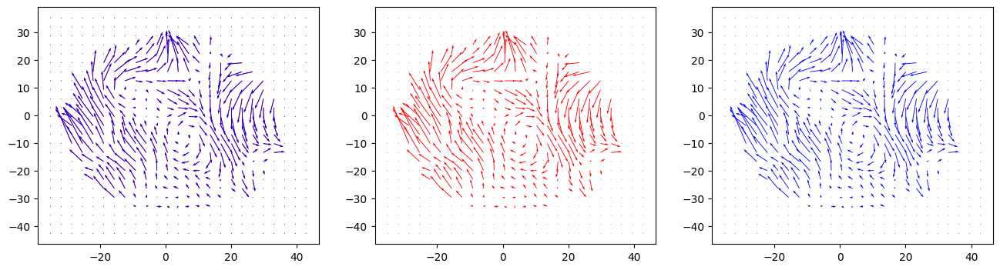

score
score:
1.0
1.0
1


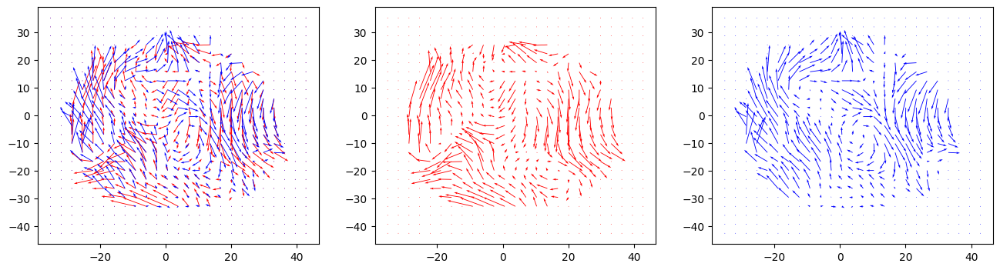

score
score:
-3.3197702793648323
-3.3197702793648323
2


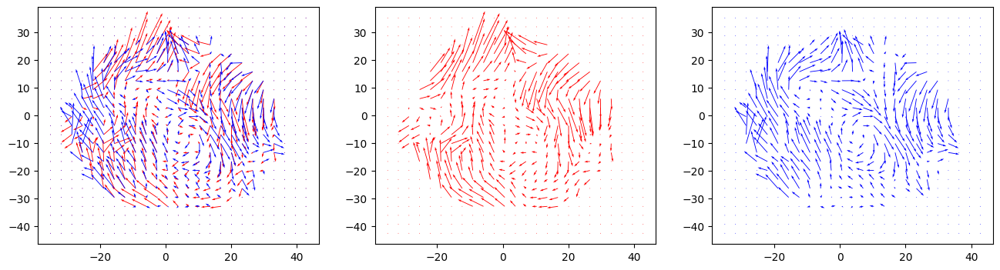

score
score:
-10.960221705002382
-10.960221705002382
3


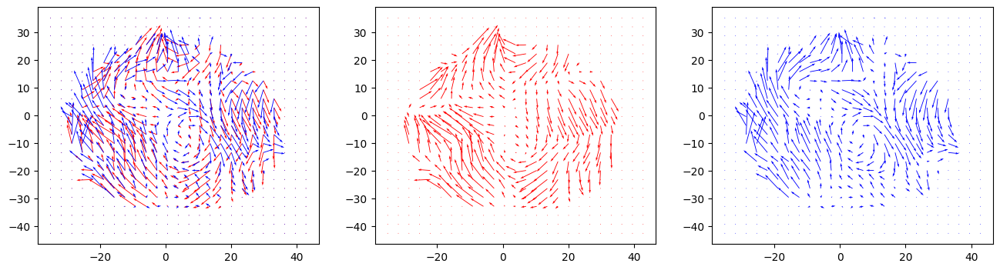

score
score:
-5.81084082412743
-5.81084082412743
4


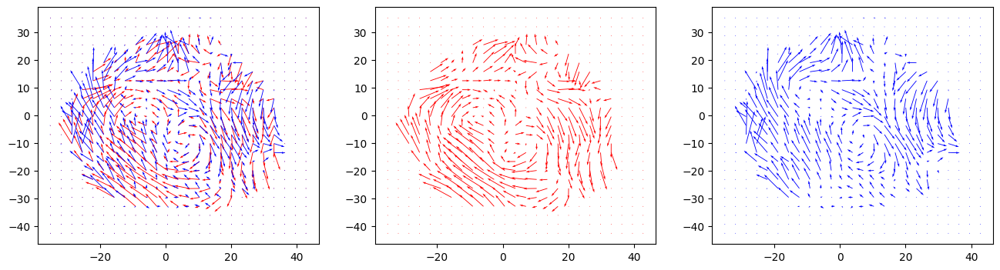

score
score:
-1.7190648329164941
-1.7190648329164941
5


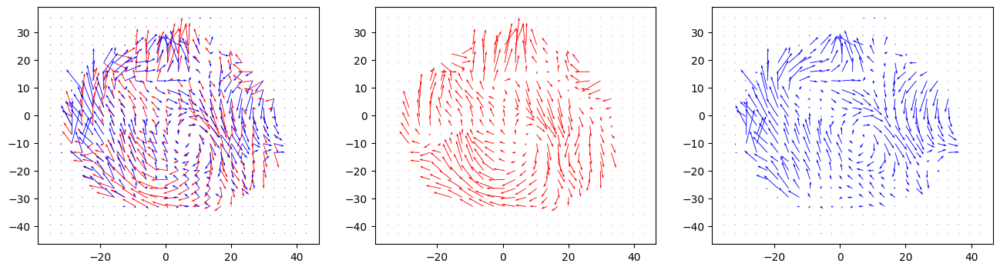

score
score:
-1.8601941058417
-1.8601941058417
6


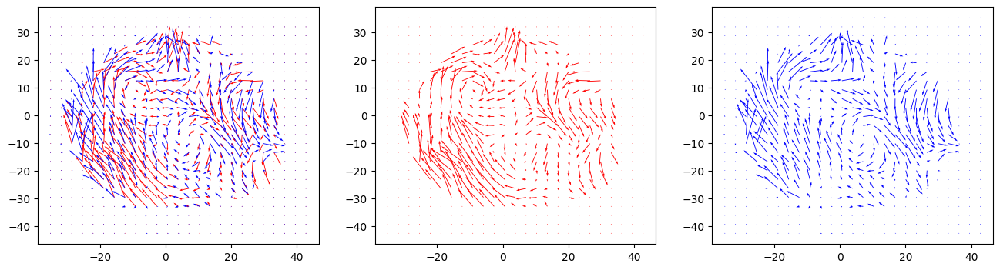

score
score:
-0.6113368804031235
-0.6113368804031235
7


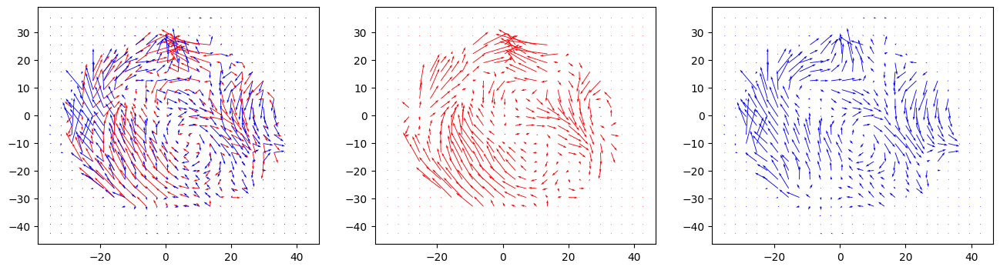

score
score:
-1.347169429374319
-1.347169429374319
8


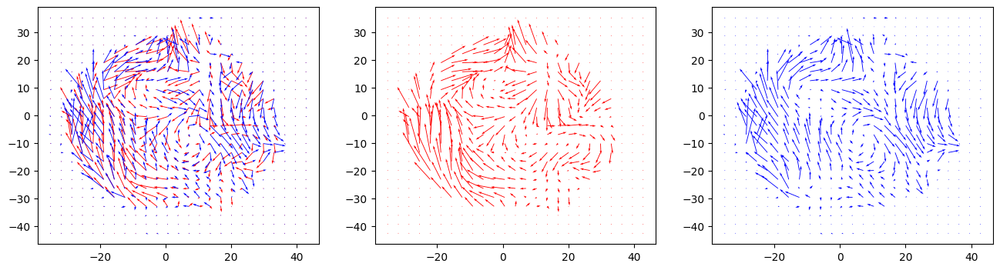

score
score:
-0.39416492142258813
-0.39416492142258813
9


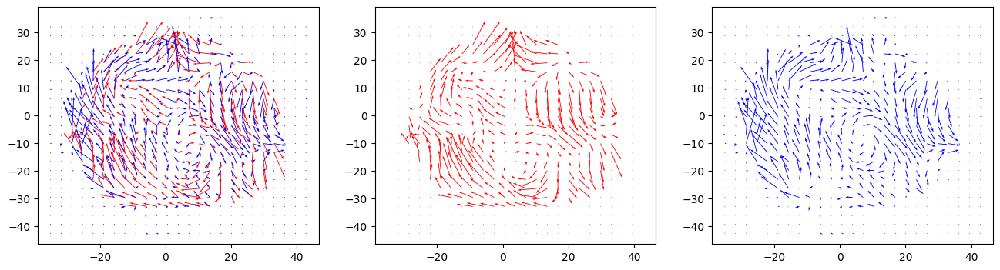

score
score:
-0.7617361970815945
-0.7617361970815945
10


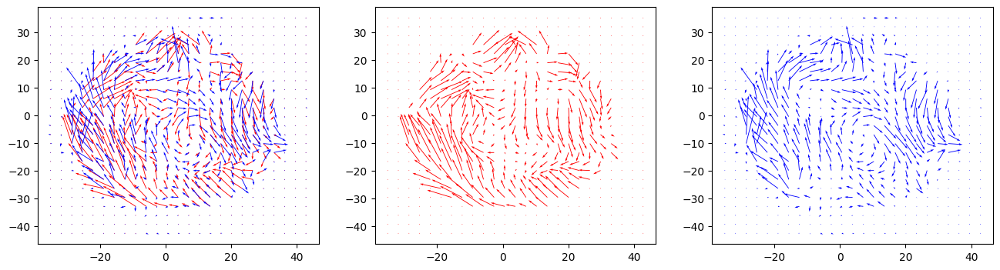

score
score:
-0.1323292857393082
-0.1323292857393082
11


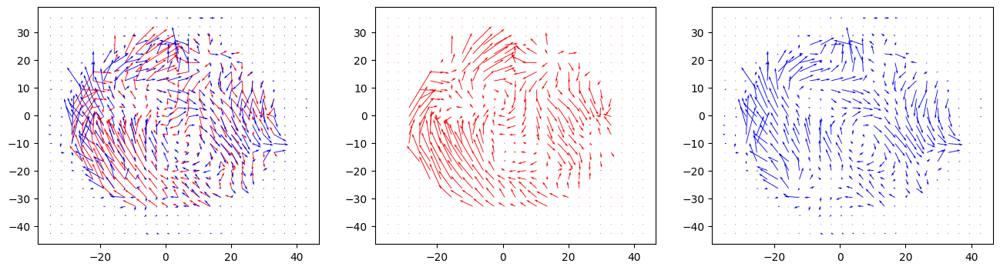

score
score:
-9.881716564096973
-9.881716564096973
12


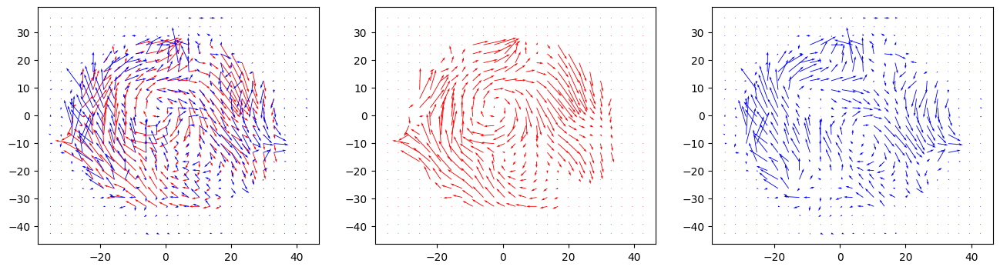

score
score:
-0.3806702742040091
-0.3806702742040091
13


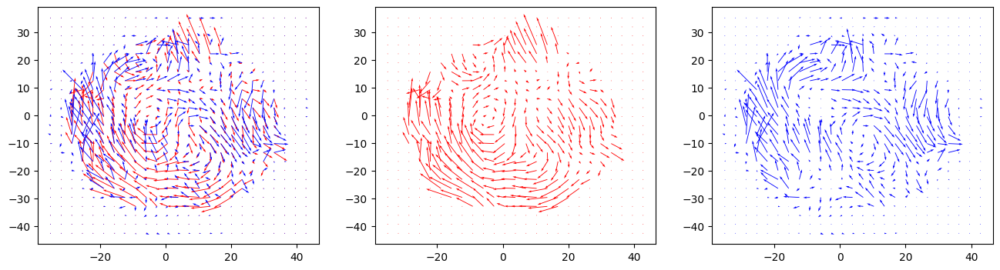

score
score:
-3.3386827215564208
-3.3386827215564208
14


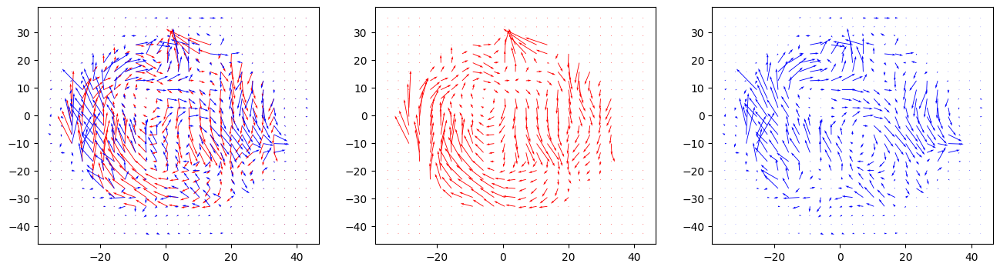

score
score:
-0.5442180142841428
-0.5442180142841428
15


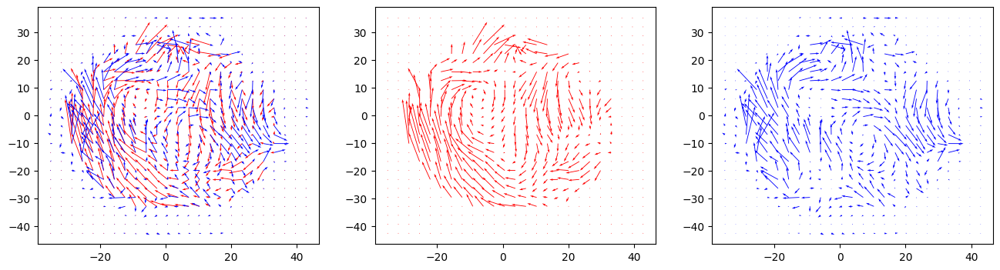

score
score:
-0.6752516259229361
-0.6752516259229361
16


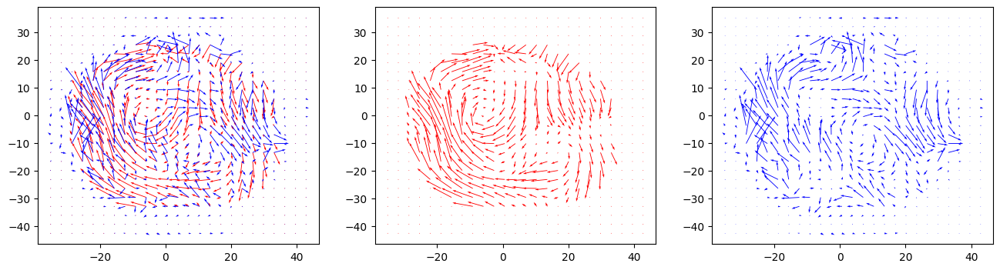

score
score:
-0.9960147949579609
-0.9960147949579609
17


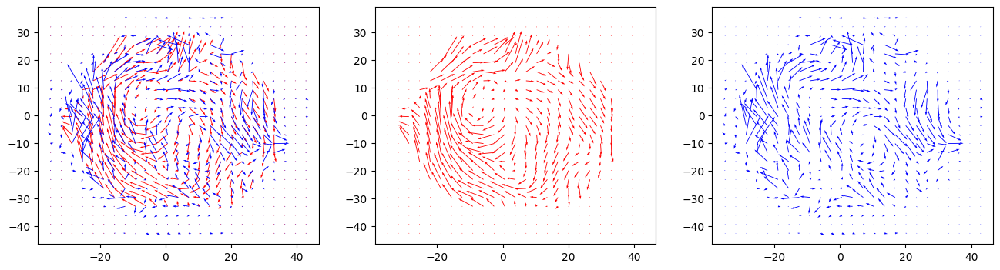

score
score:
-0.8108828148013488
-0.8108828148013488
18


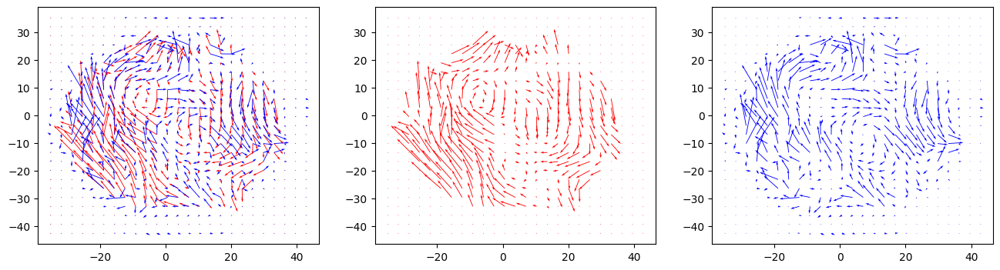

score
score:
-1.1680546069878397
-1.1680546069878397
19


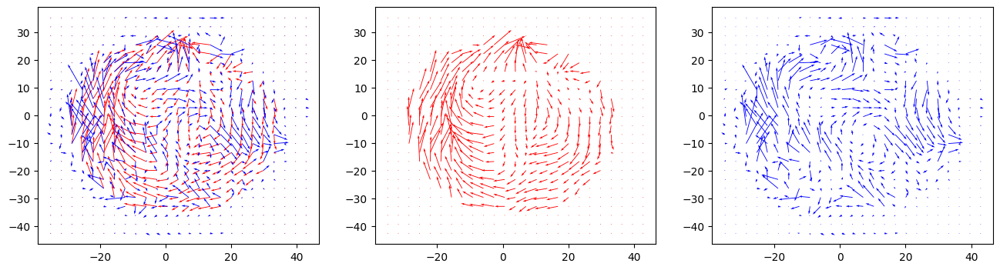

score
score:
-0.4899707481527519
-0.4899707481527519
20


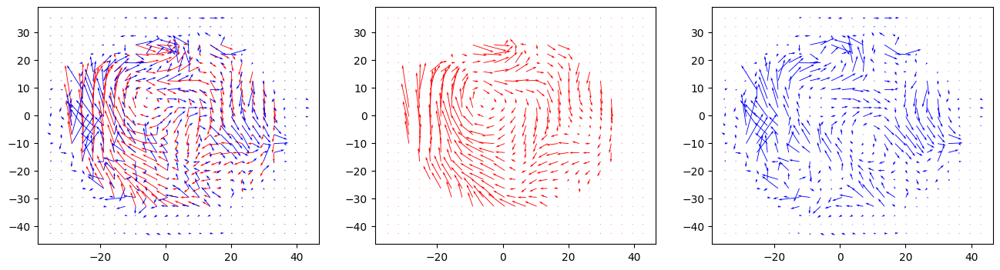

score
score:
-0.5210119531267329
-0.5210119531267329
21


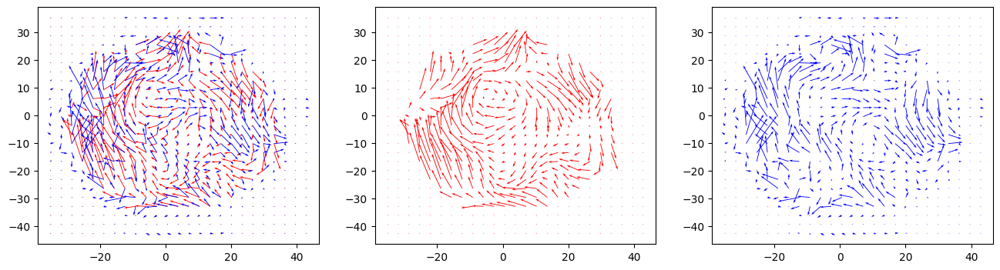

score
score:
-1.9067024282040526
-1.9067024282040526
22


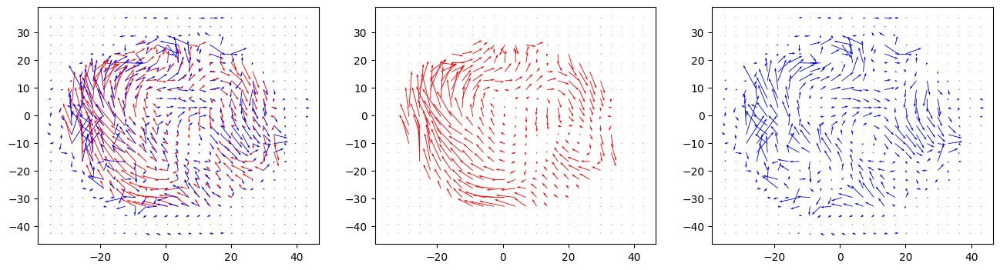

score
score:
-1.3151451806990826
-1.3151451806990826
23


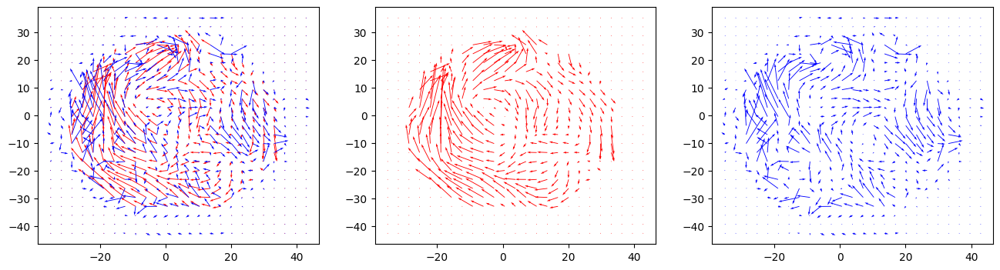

score
score:
-1.652013752779777
-1.652013752779777
24


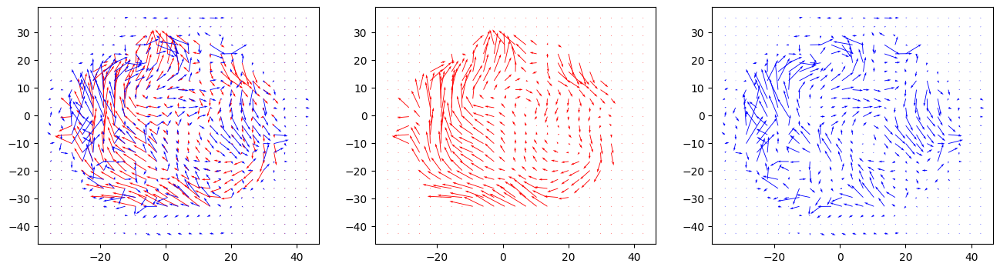

score
score:
-1.4371216402088076
-1.4371216402088076
25


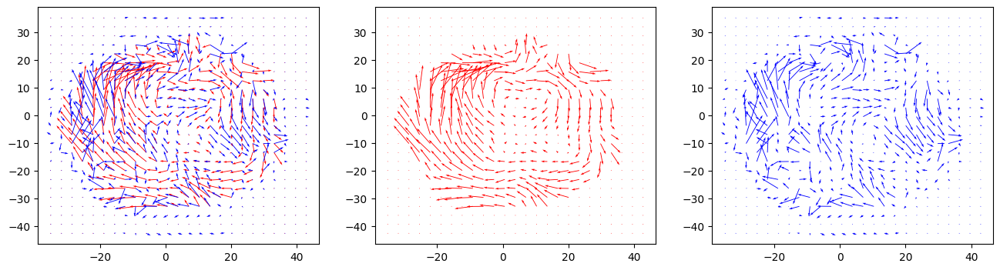

score
score:
-2.218243982502052
-2.218243982502052
26


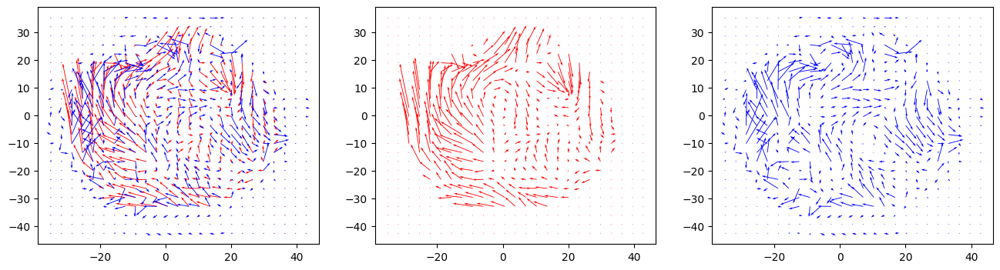

score
score:
-1.042873289631238
-1.042873289631238
27


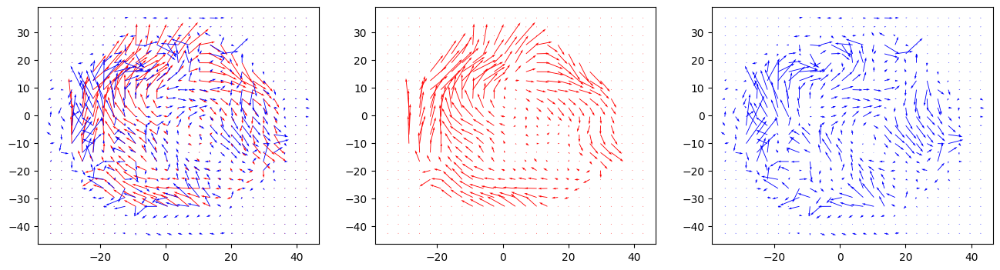

score
score:
-1.4144599188546663
-1.4144599188546663
28


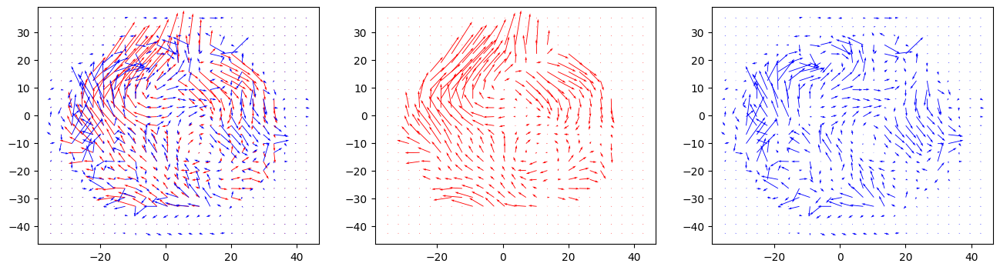

score
score:
-7.705289625698616
-7.705289625698616
29


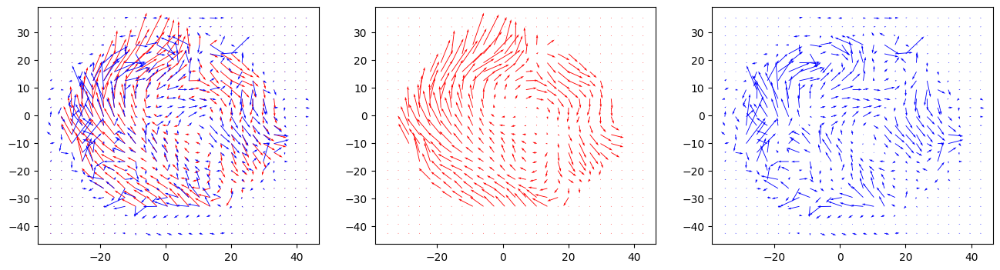

score
score:
-0.41205539311253503
-0.41205539311253503
30


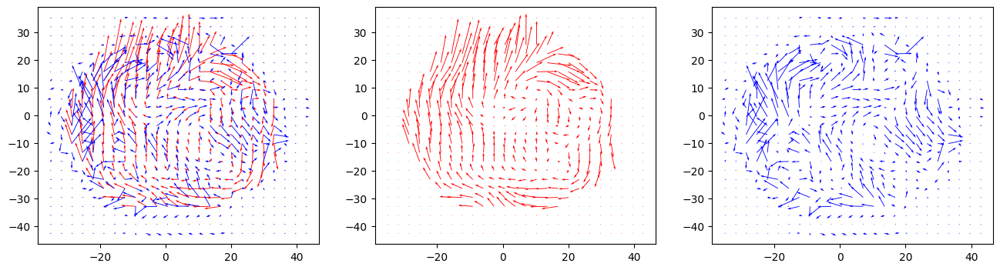

score
score:
-20.154404408860987
-20.154404408860987
31


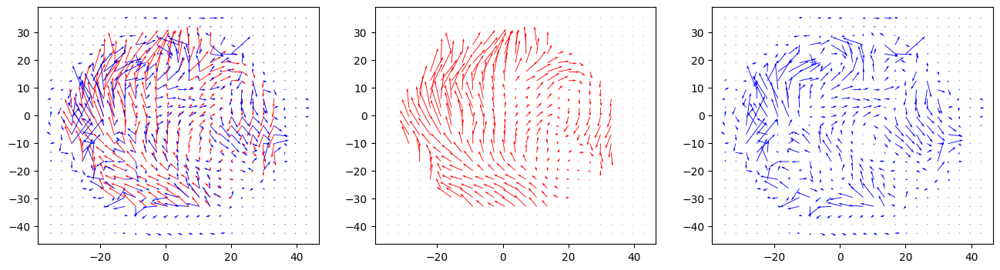

score
score:
-1.9243726993790073
-1.9243726993790073
32


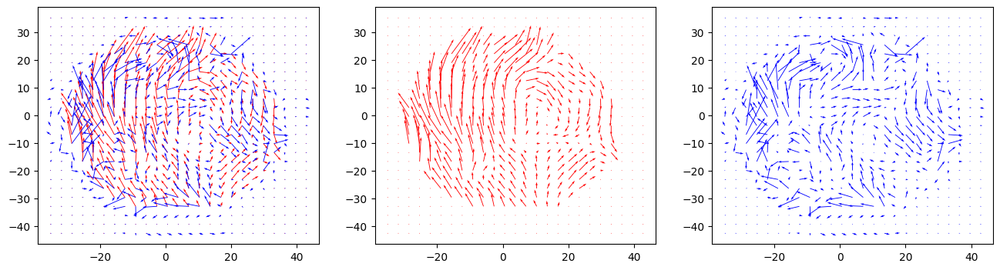

score
score:
-0.9650811527109214
-0.9650811527109214
33


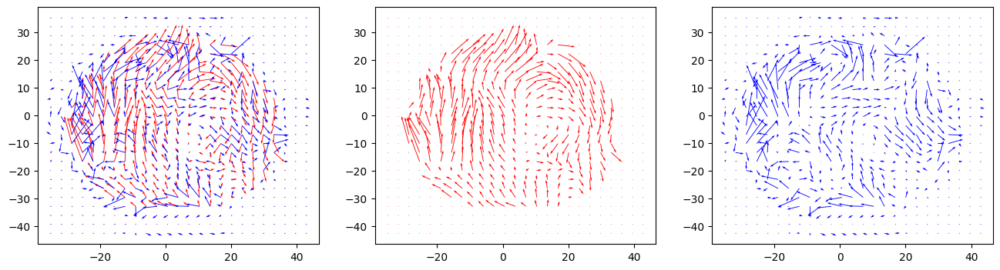

score
score:
-0.3658111762031945
-0.3658111762031945
34


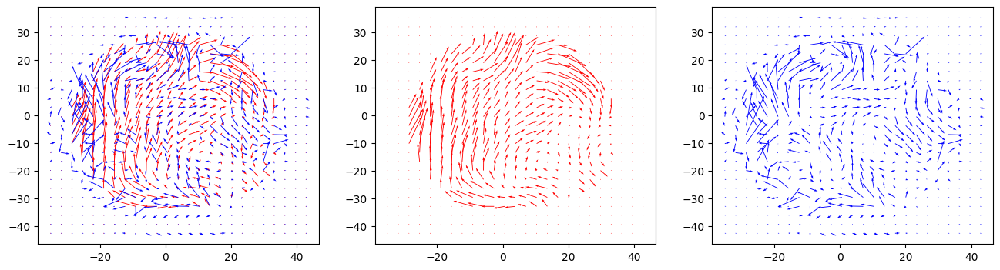

score
score:
-0.5244745280808084
-0.5244745280808084
35


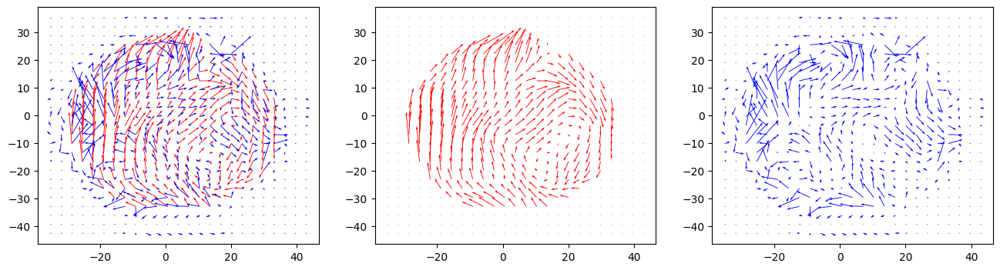

score
score:
-1.2443543289774315
-1.2443543289774315
36


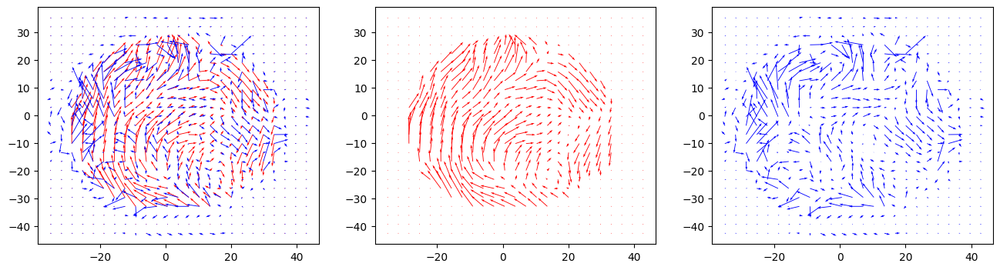

score
score:
-1.3815984709215248
-1.3815984709215248
37


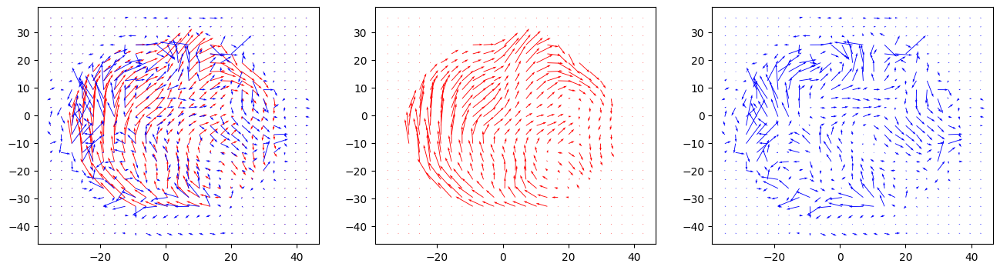

score
score:
-0.8776063128351937
-0.8776063128351937
38


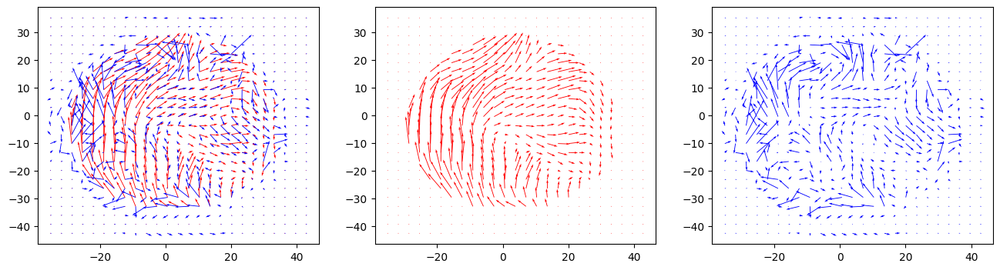

score
score:
-2.5620936255297835
-2.5620936255297835
39


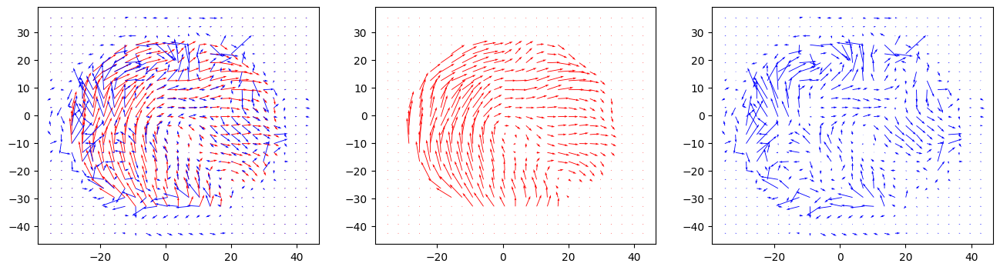

score
score:
-3.166835475154827
-3.166835475154827


In [13]:
for i in range(40):
    print(i)
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 3, 1)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],u_train[:,:,i,0],u_train[:,:,i,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.subplot(1, 3, 2)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],u_train[:,:,i,0],u_train[:,:,i,1],color='r')
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.subplot(1, 3, 3)
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],u_dot_train[:,:,i+1,0],u_dot_train[:,:,i+1,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.show()
    print('score')
    print(testscore(pltpredict[:,:,i,],save[:,:,i,:]))

In [14]:
pltpredict=u_train+dot_tmp*dt
pltpredict[:,:,1:]=pltpredict[:,:,:len(t)-1]
testscore(pltpredict,save)


score:
-1.0780643990302194


-1.0780643990302194

0


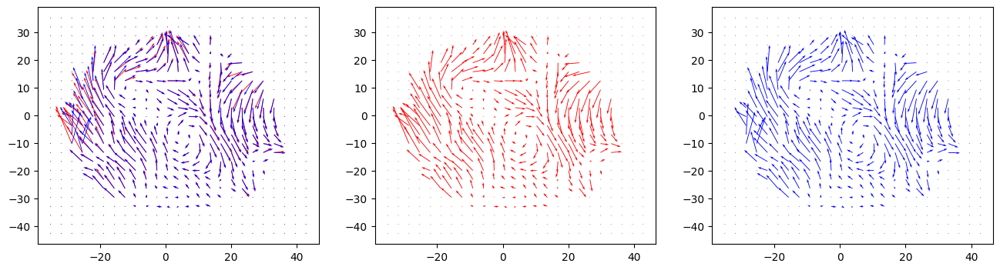

score
score:
0.9059179953853803
1


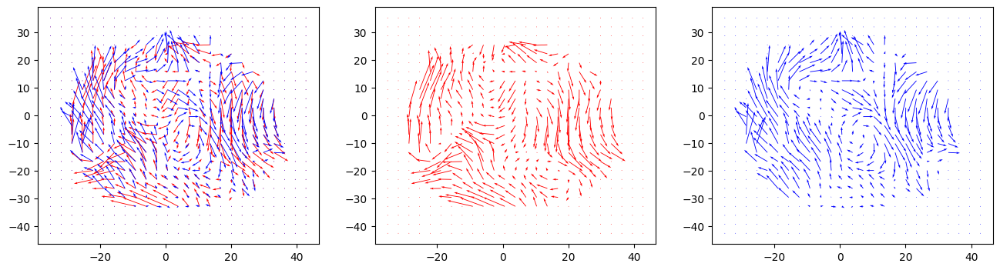

score
score:
-3.3197702793648323
2


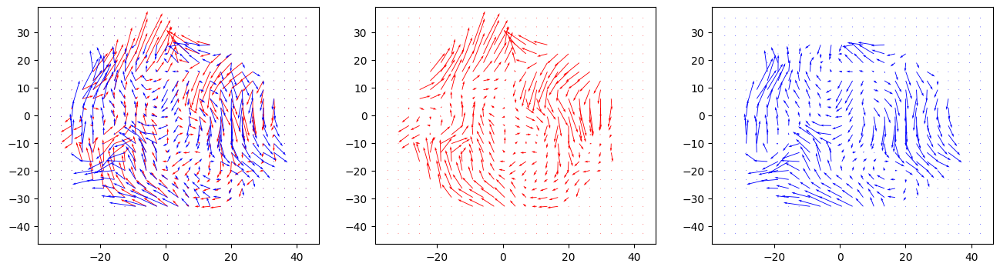

score
score:
-11.175443730329244
3


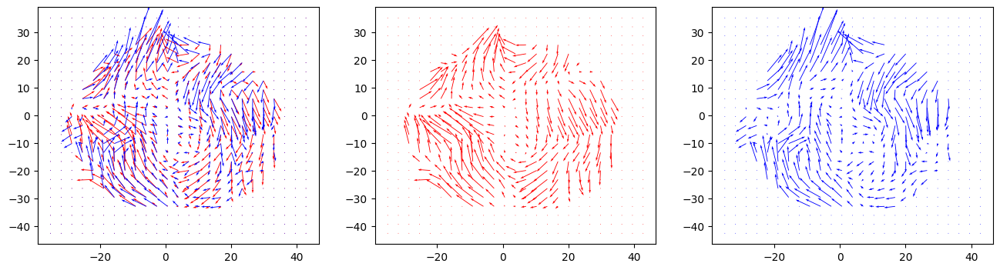

score
score:
-2.072755422681804
4


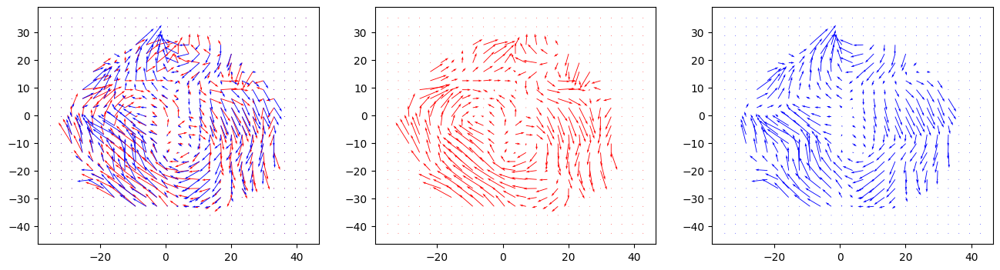

score
score:
-1.530856512603323
5


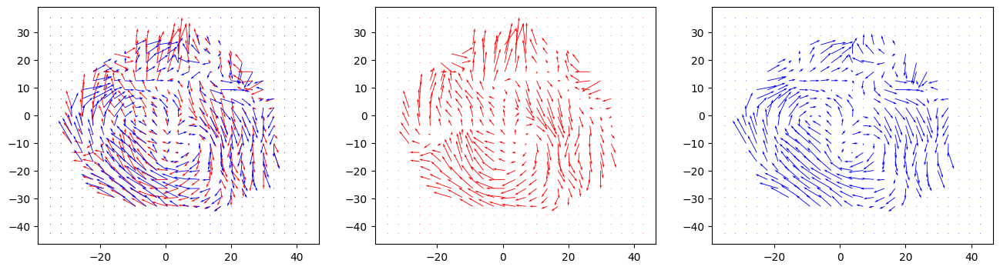

score
score:
-0.8186533143325205
6


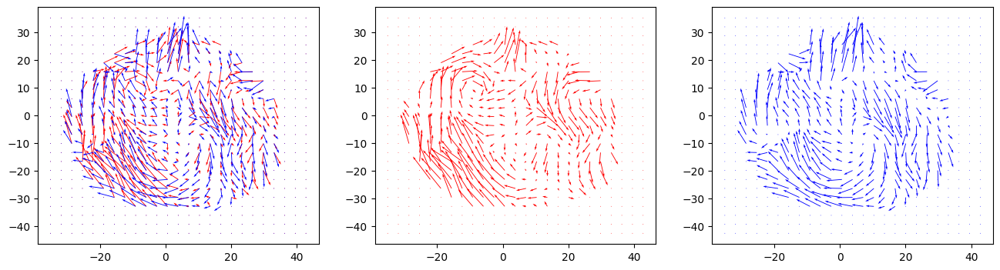

score
score:
-0.24356783608725474
7


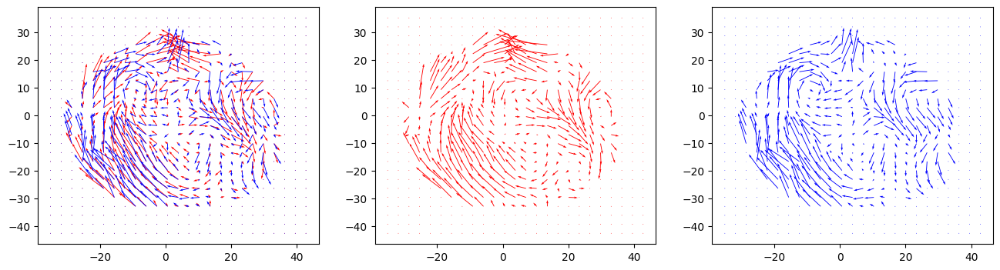

score
score:
-0.6214065263154378
8


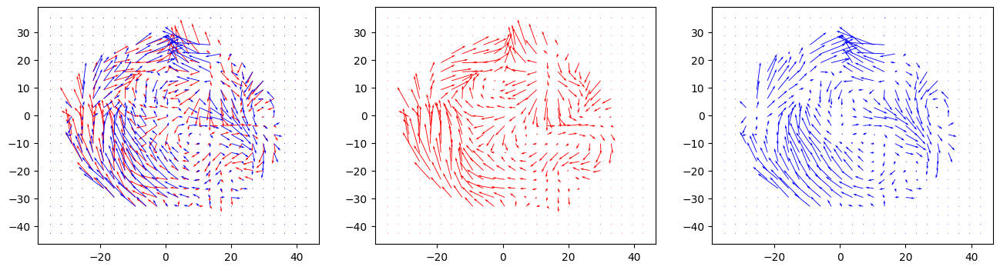

score
score:
0.011894790743211895
9


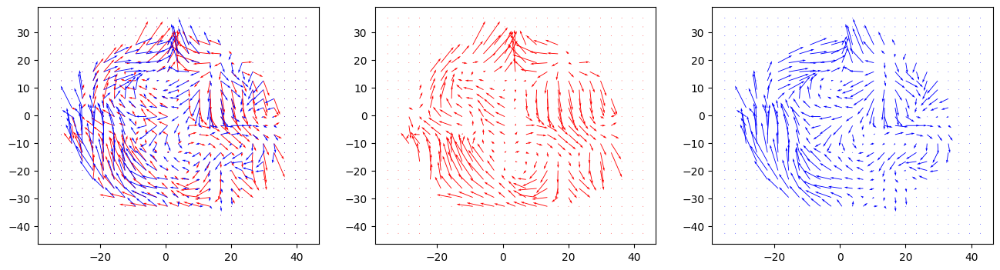

score
score:
-0.9549894303284818
10


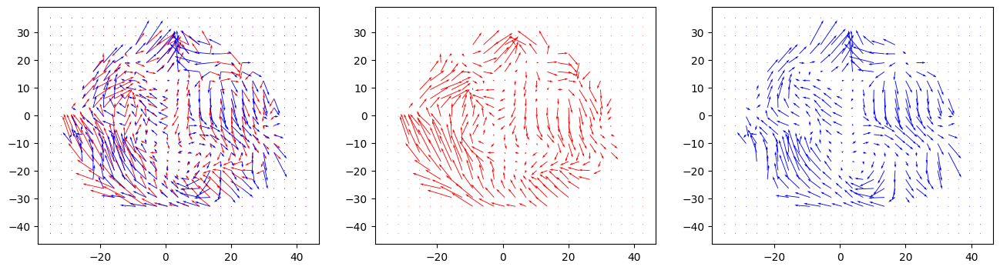

score
score:
0.0745729729993
11


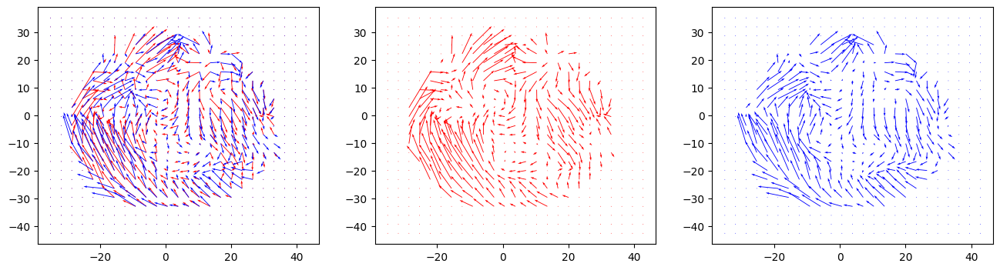

score
score:
-1.0367368306115967
12


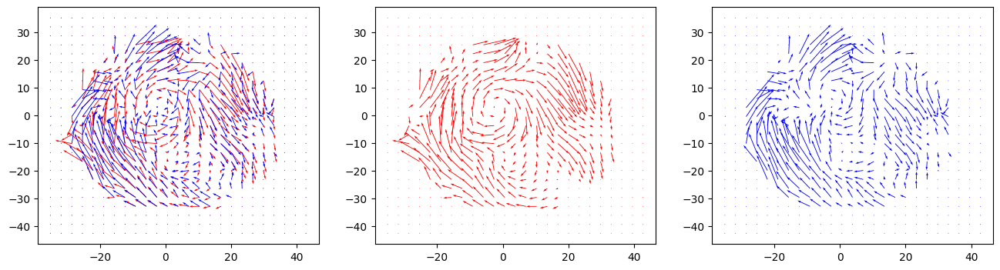

score
score:
0.041130314975637634
13


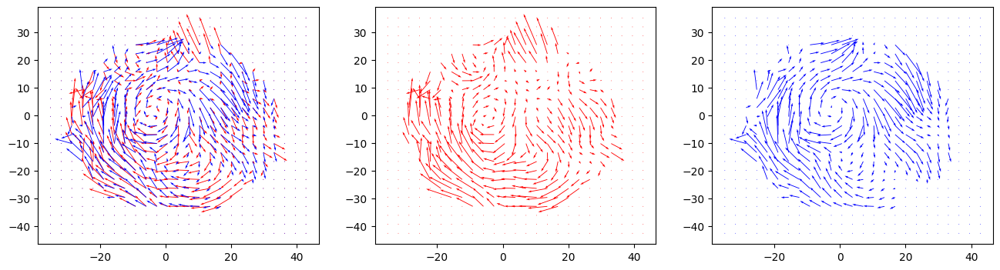

score
score:
-6.679734262341551
14


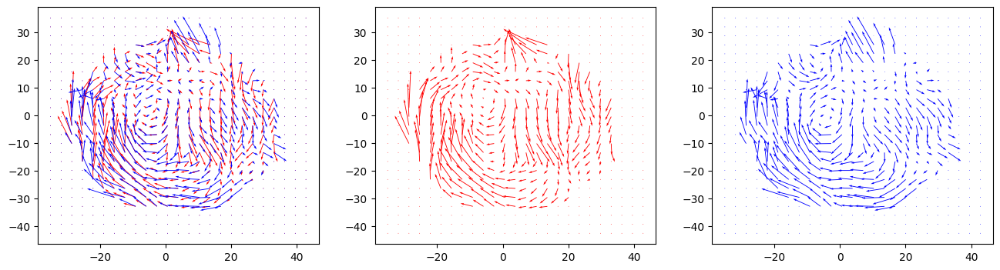

score
score:
-0.13925093174509723
15


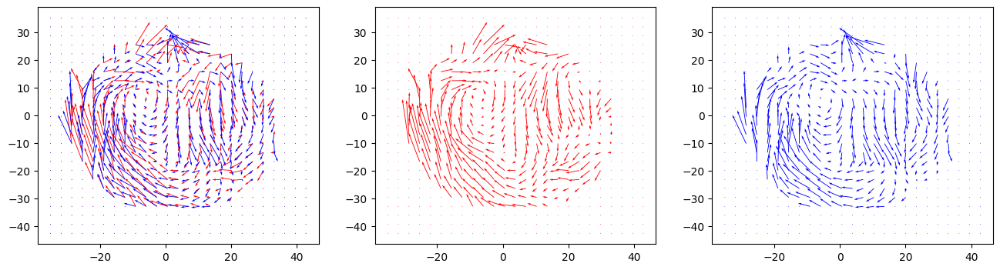

score
score:
0.0353185219537354
16


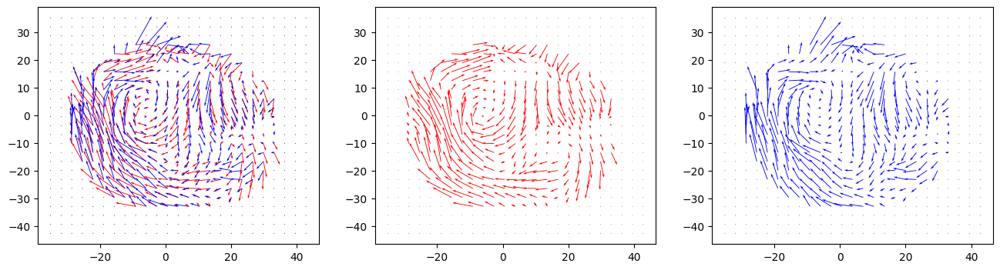

score
score:
-0.11317953800193631
17


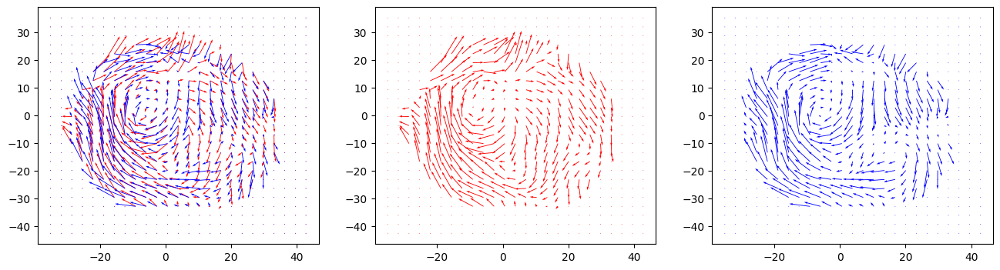

score
score:
0.11394082225248611
18


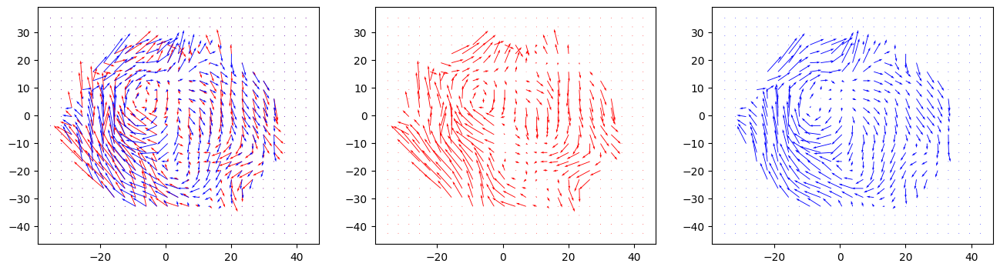

score
score:
-0.732202273841623
19


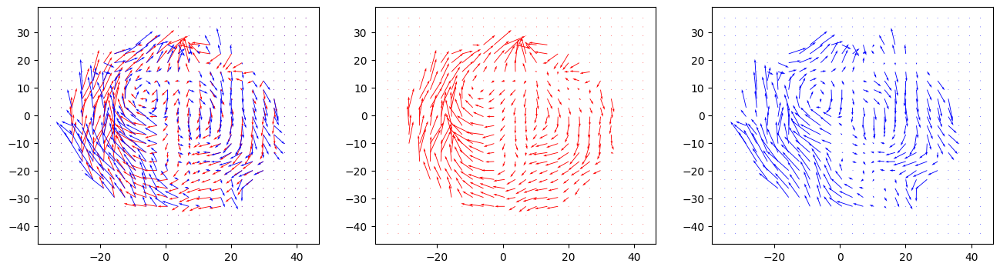

score
score:
-1.3801389602260095
20


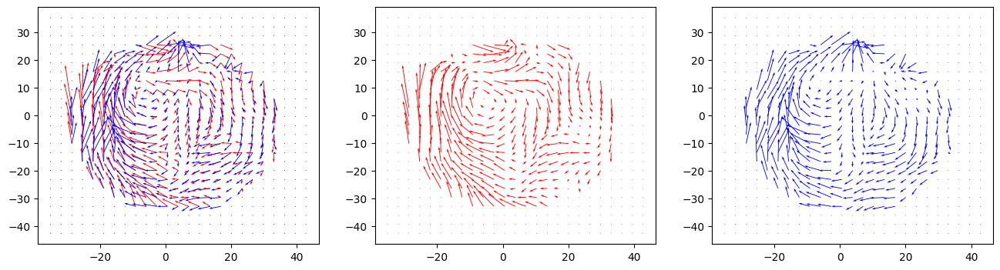

score
score:
-0.1061423207160043
21


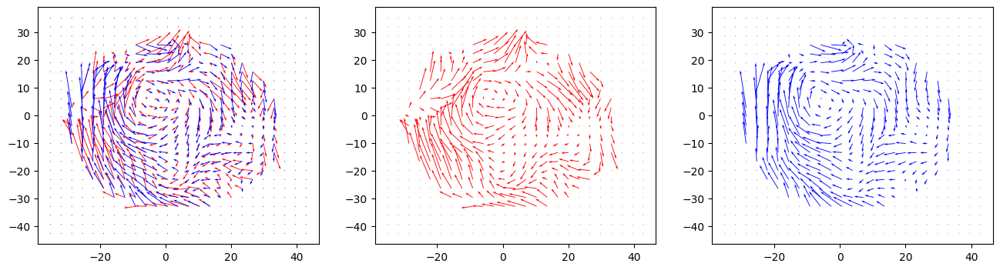

score
score:
-1.3504211277888691
22


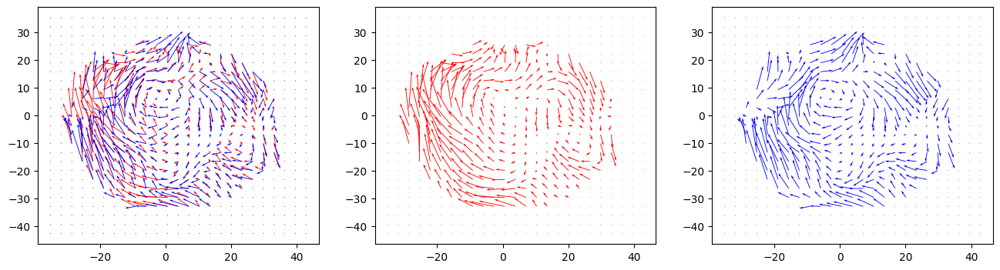

score
score:
-0.24181496081164727
23


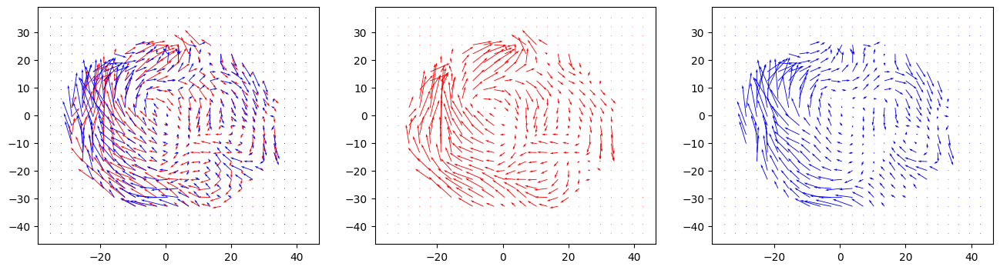

score
score:
-1.0155750823486256
24


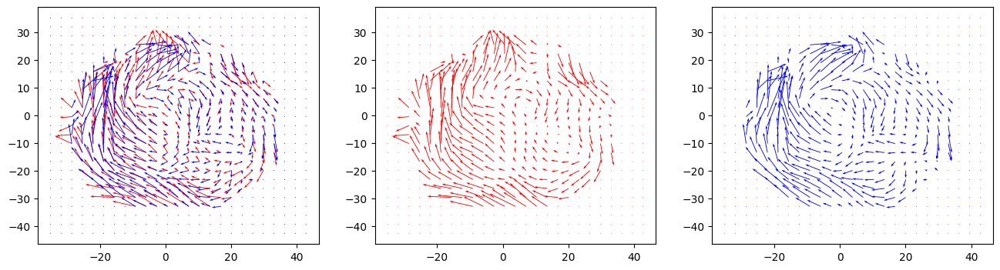

score
score:
-0.29058262463099216
25


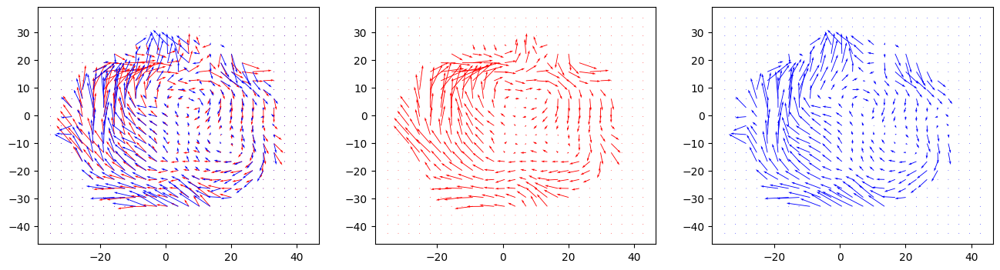

score
score:
-0.17120308756346528
26


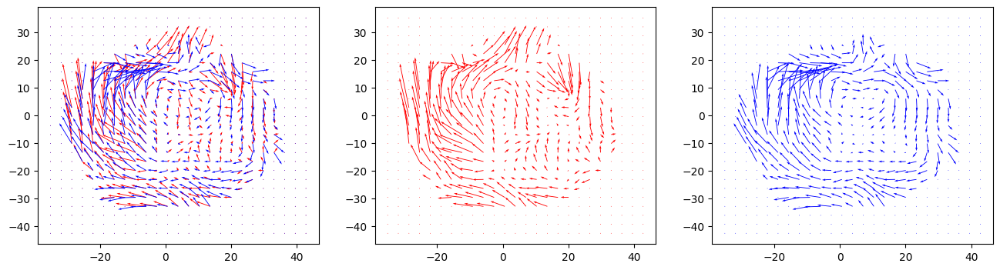

score
score:
-0.2971940818436278
27


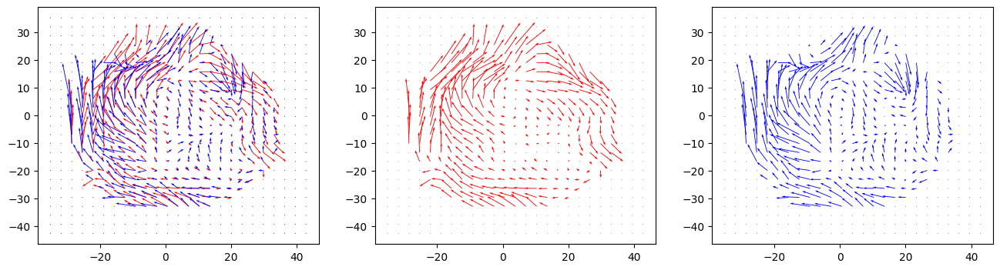

score
score:
-0.0831270507303916
28


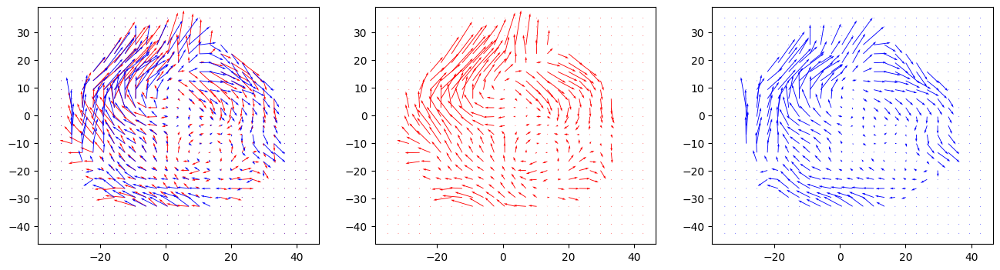

score
score:
-5.935680420335433
29


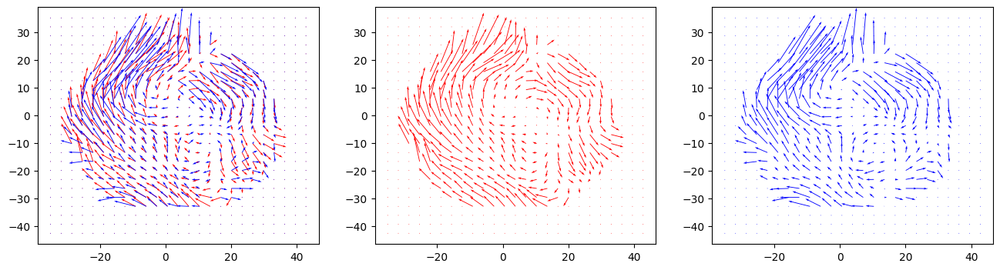

score
score:
0.2181367279407779
30


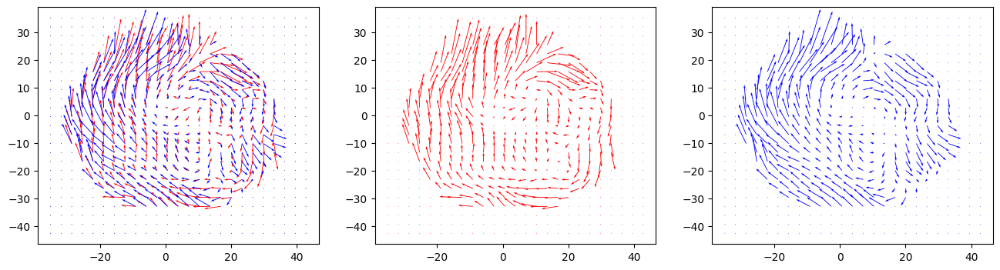

score
score:
-2.6945035080617816
31


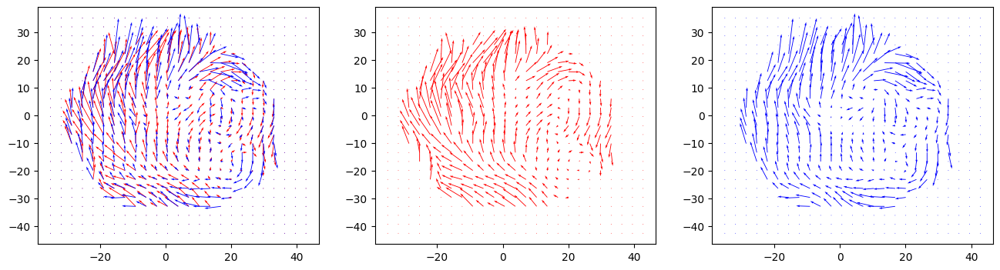

score
score:
-0.7464805418053014
32


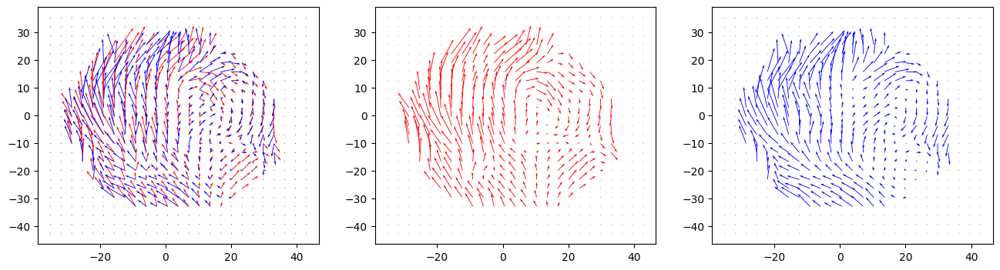

score
score:
-0.28335215771737693
33


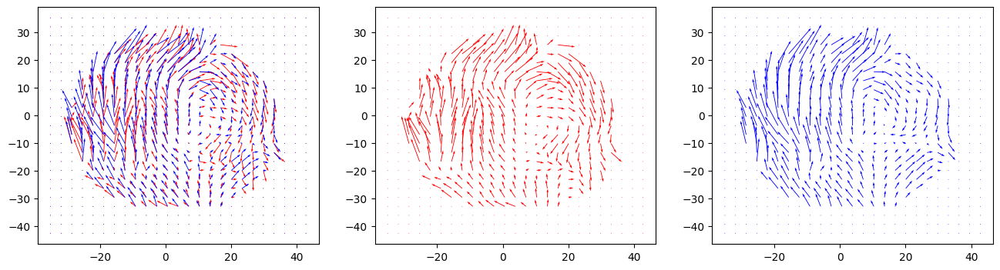

score
score:
0.26329015139263956
34


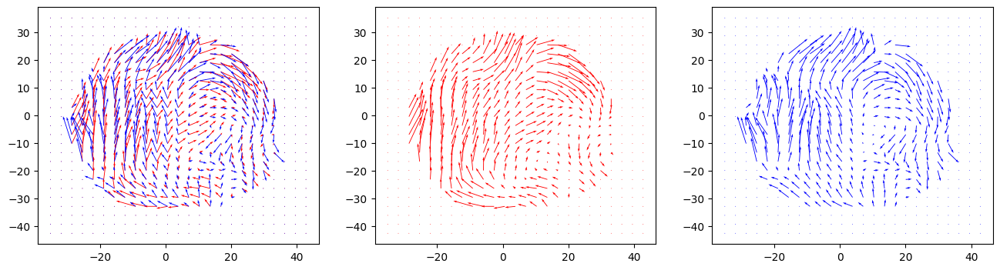

score
score:
-0.019360503986782837
35


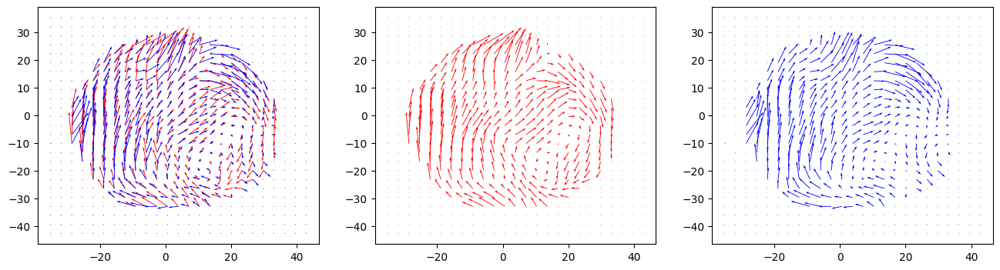

score
score:
0.24161306510262281
36


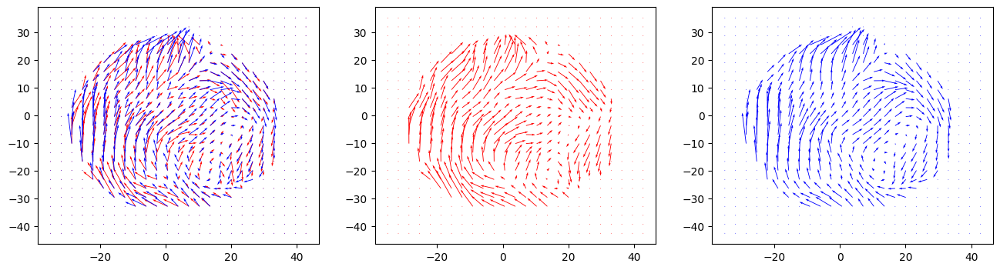

score
score:
0.1375750898745186
37


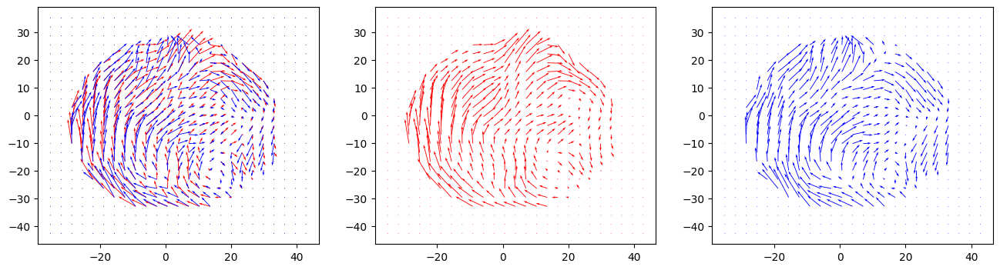

score
score:
-0.09150002110846743
38


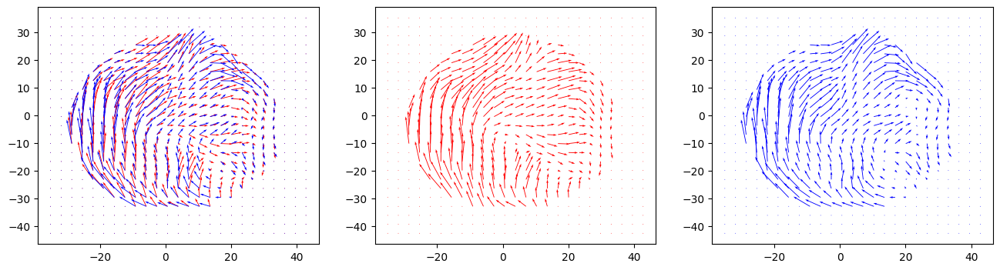

score
score:
-0.020872880331334345
39


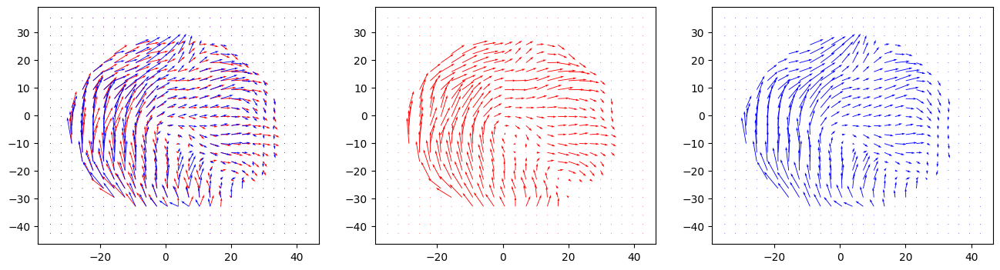

score
score:
-0.9794746270262035


In [15]:
for i in range(40):
    print(i)
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 3, 1)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],u_train[:,:,i,0],u_train[:,:,i,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.subplot(1, 3, 2)
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],u_train[:,:,i,0],u_train[:,:,i,1],color='r')
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.subplot(1, 3, 3)
    #plt.quiver(spatial_grid[:,:,1],spatial_grid[:,:,0],u_dot_train[:,:,i+1,0],u_dot_train[:,:,i+1,1],color='r')
    plt.quiver(spatial_grid[:,:,0],spatial_grid[:,:,1],pltpredict[:,:,i,0],pltpredict[:,:,i,1],color='b')
    plt.show()
    print('score')
    testscore(pltpredict[:,:,i,],save[:,:,i,:])